In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from math import atan2, degrees
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

In [3]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__)
import cufflinks as cf
# Para Notebooks
init_notebook_mode(connected=True)

# For offline use
cf.go_offline()


3.9.0


In [4]:
csidf = pd.read_excel("subcarriers_amp_pos_pot.xlsx", sheet_name="subcarriers_amp_pos_pot")
csidf.drop("Unnamed: 0", axis=1, inplace=True)

In [5]:
csidf.head()

,device,local,x,y,P_MW_LLTF,P_MW_HTLTF,P_DBM_LLTF,P_DBM_HTLTF,LLTF_-32,LLTF_-31,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,DIR,A1,1,3,68,1763,18.326305,32.462711,0,0,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,DIR,A1,1,3,91,2902,19.625982,34.627993,0,0,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,DIR,A1,1,3,79,1819,19.009755,32.599737,0,0,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,DIR,A1,1,3,82,2482,19.157725,33.949590,0,0,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,DIR,A1,1,3,43,736,16.433430,28.670187,0,0,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


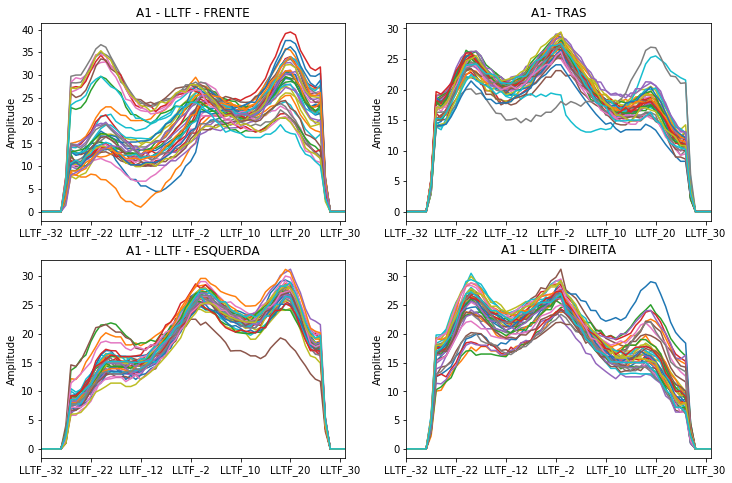

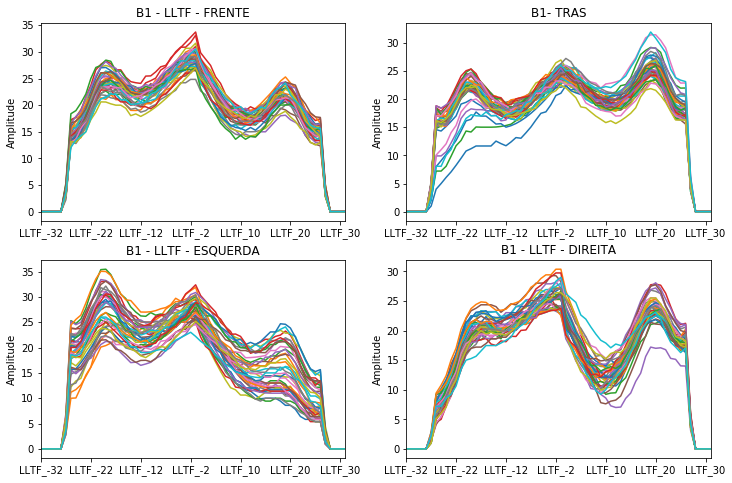

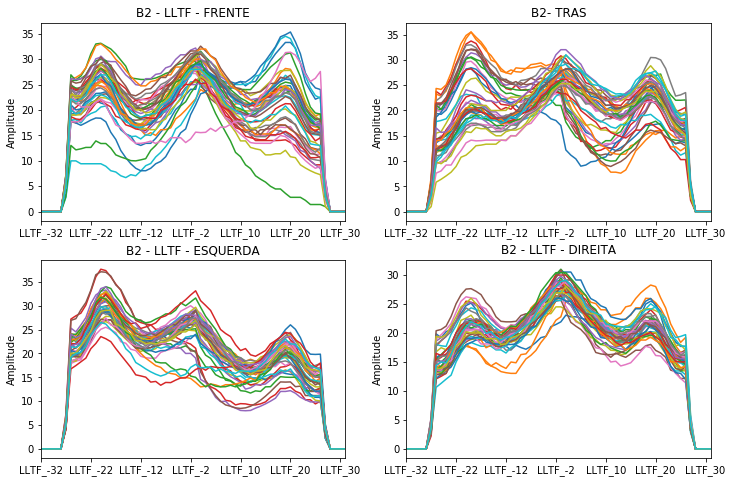

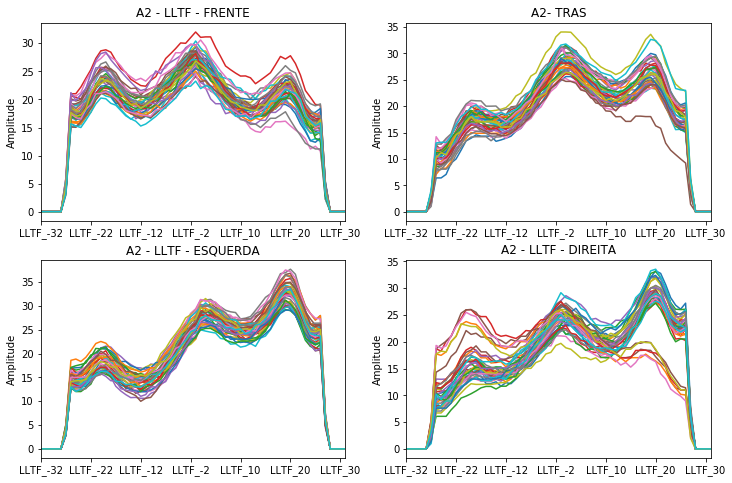

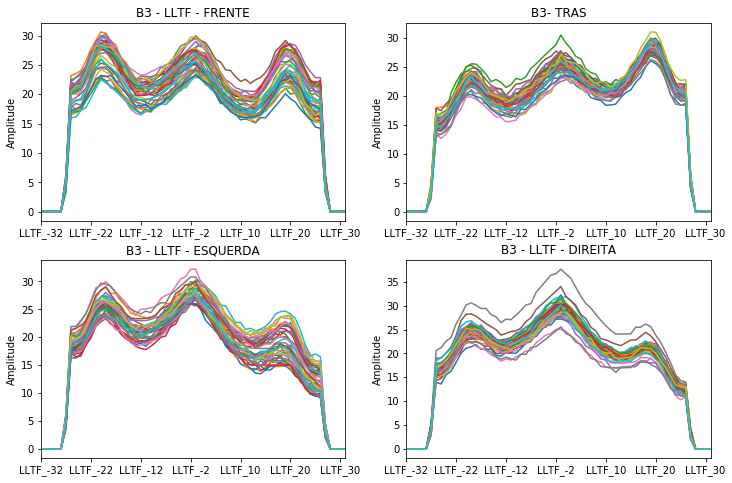

...

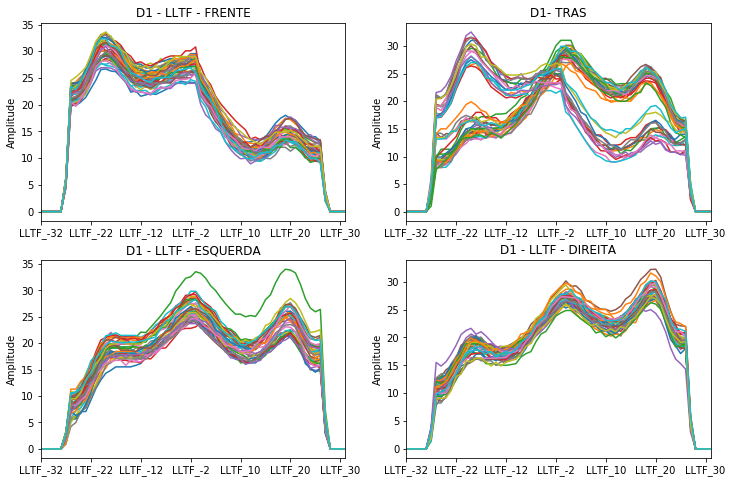

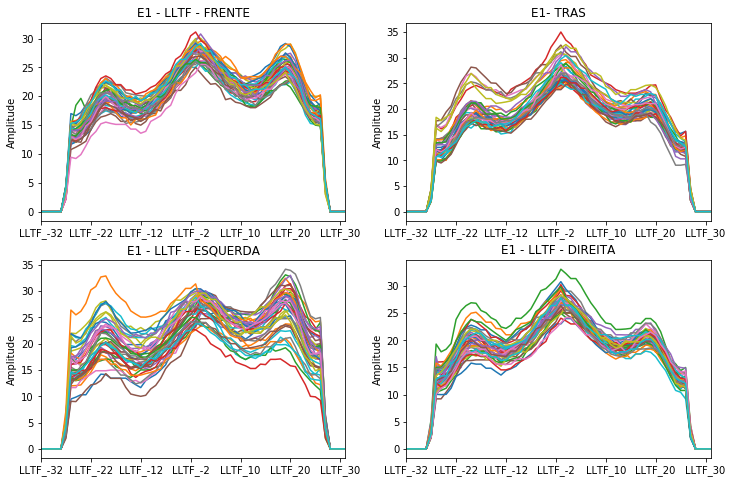

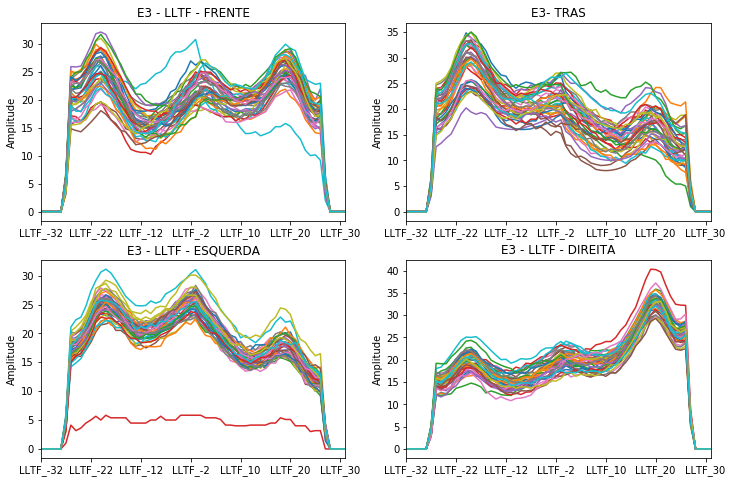

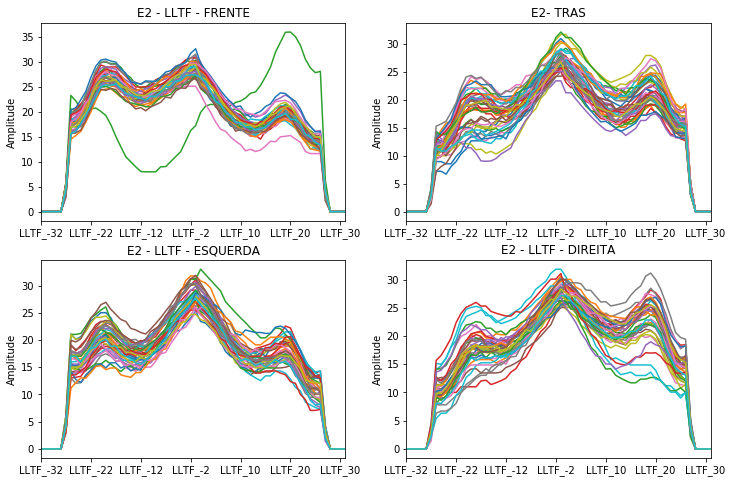

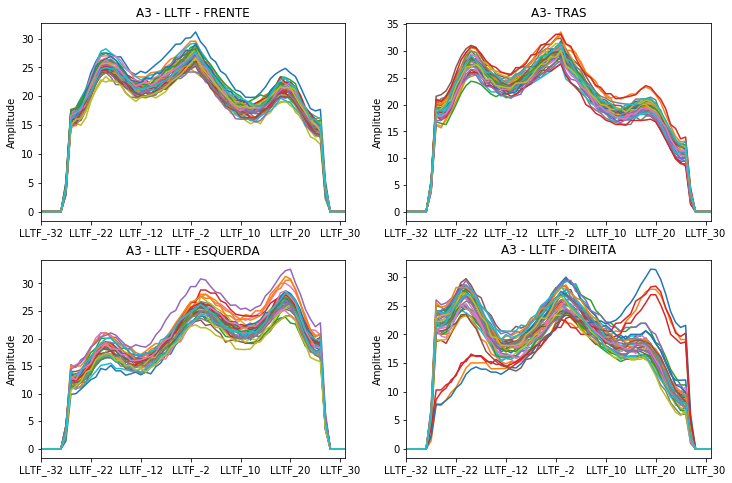

In [10]:
#4 GRÁFICOS POR LOCAL - 1 EM CADA DIREÇÃO - LLTF
for w in csidf["local"].unique():
    data = csidf[csidf["local"]==w]
    data_frente = data[data["device"]=="FRENTE"]
    data_tras = data[data["device"]=="TRAS"]
    data_esq = data[data["device"]=="ESQ"]
    data_dir = data[data["device"]=="DIR"]
    fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(12,8))
    for x in data_frente.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" - LLTF - FRENTE")
    for x in data_tras.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +"- TRAS")
    for x in data_esq.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" - LLTF - ESQUERDA")
    for x in data_dir.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" - LLTF - DIREITA")
    fig_name = w + "_LLTF_4_Direcoes.png"
    plt.savefig(fig_name)

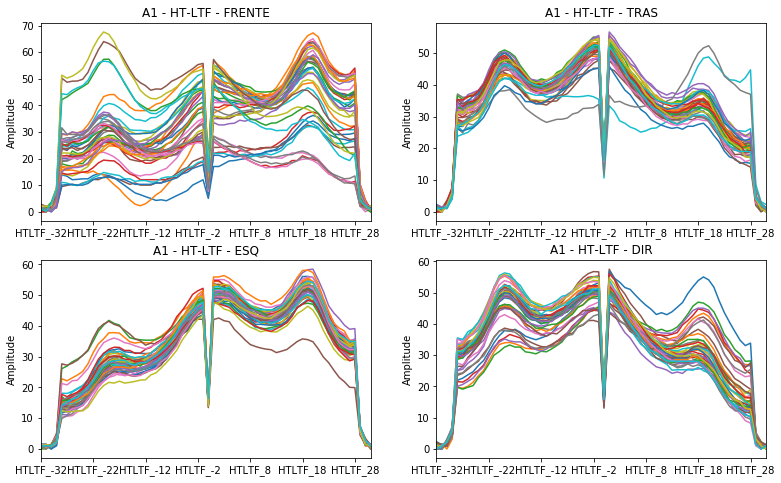

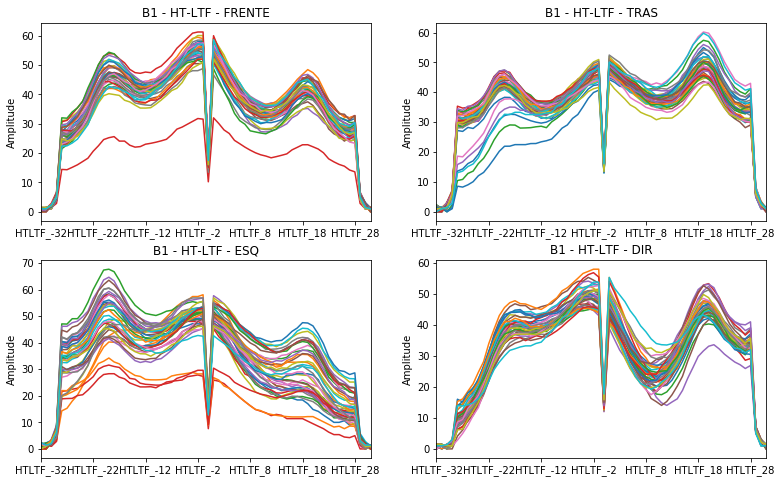

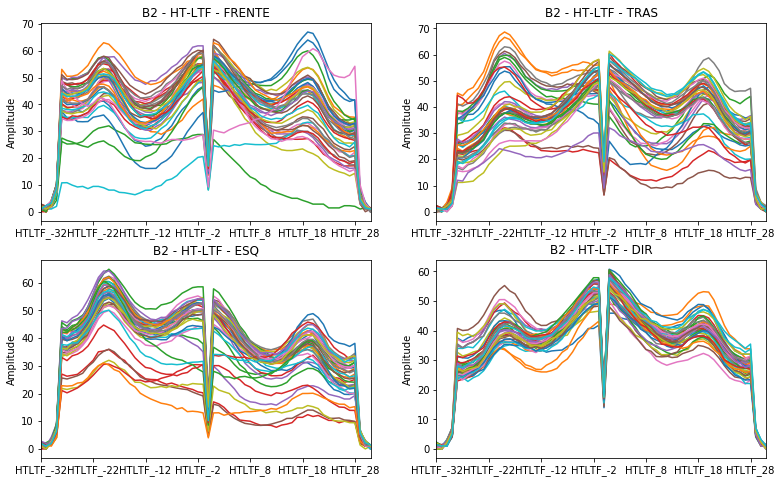

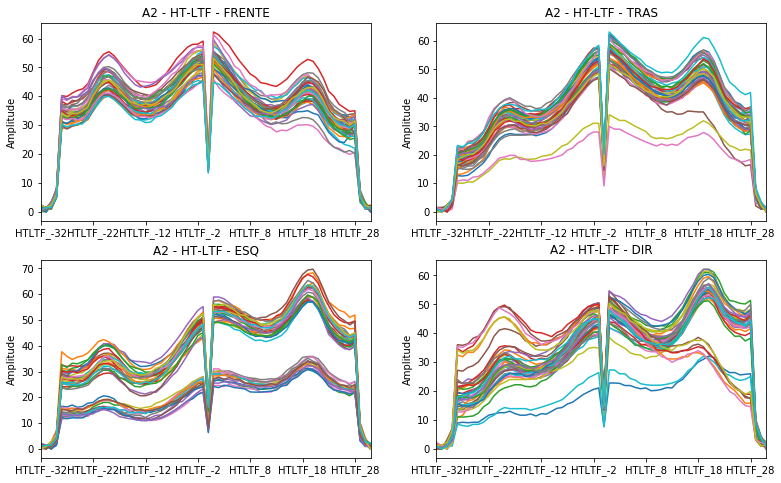

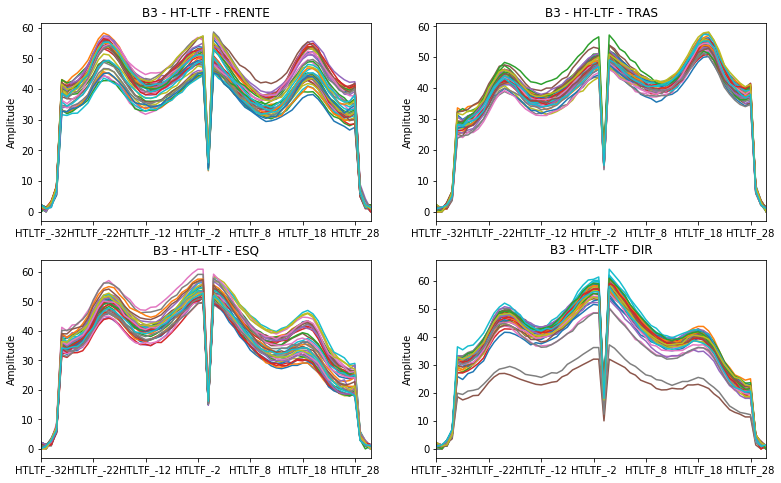

...

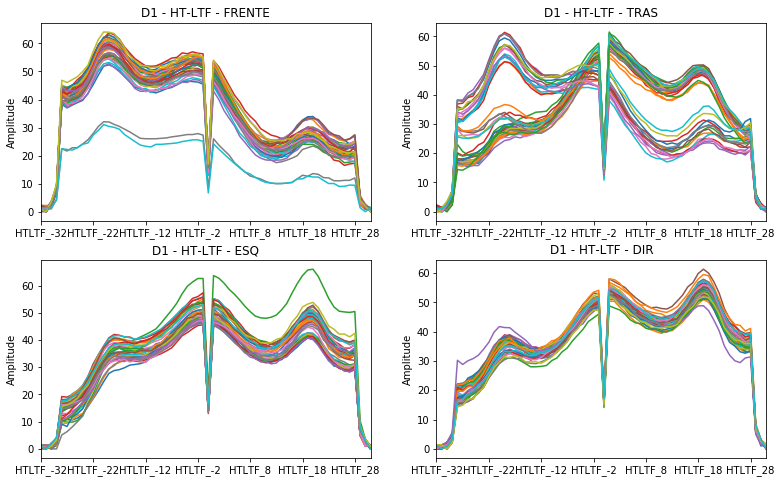

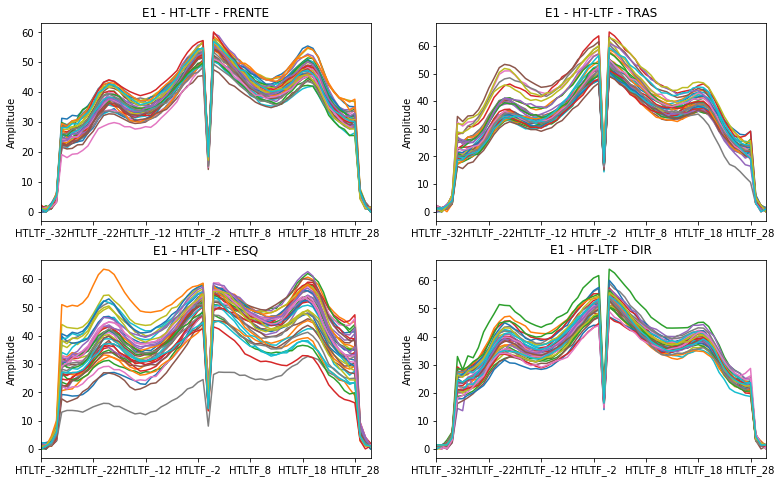

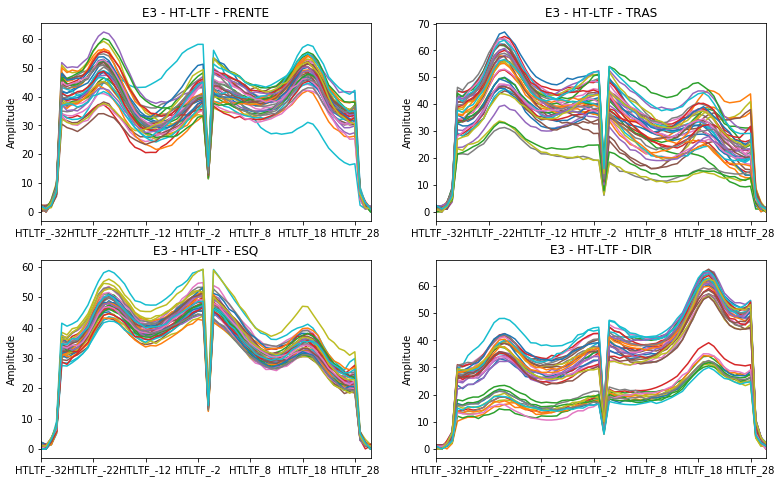

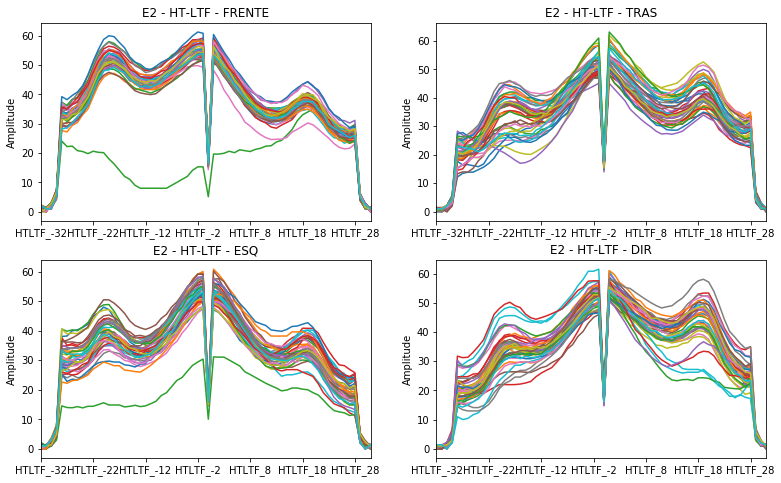

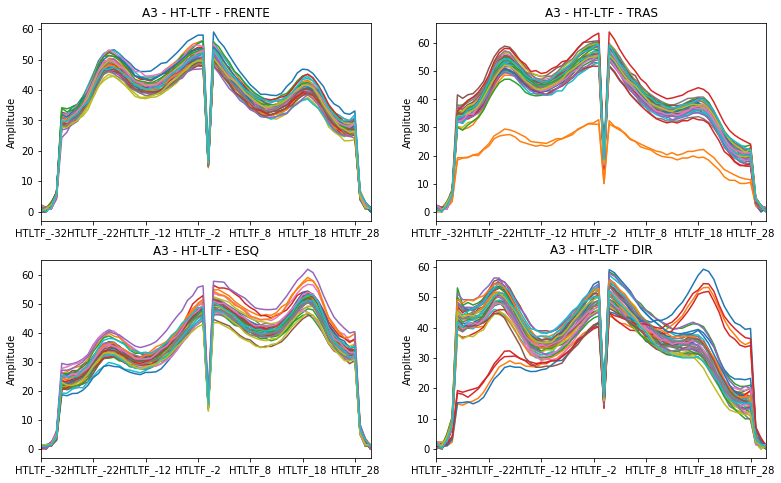

In [12]:
#4 GRÁFICOS POR LOCAL - 1 EM CADA DIREÇÃO - HT-LTF
for w in csidf["local"].unique():
    data = csidf[csidf["local"]==w]
    data_frente = data[data["device"]=="FRENTE"]
    data_tras = data[data["device"]=="TRAS"]
    data_esq = data[data["device"]=="ESQ"]
    data_dir = data[data["device"]=="DIR"]
    fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(13,8))
    for x in data_frente.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" - HT-LTF - FRENTE")
    for x in data_tras.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" - HT-LTF - TRAS")
    for x in data_esq.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" - HT-LTF - ESQ")
    for x in data_dir.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" - HT-LTF - DIR")
    fig_name = w + "_HT_LTF_4_Direcoes.png"
    plt.savefig(fig_name)

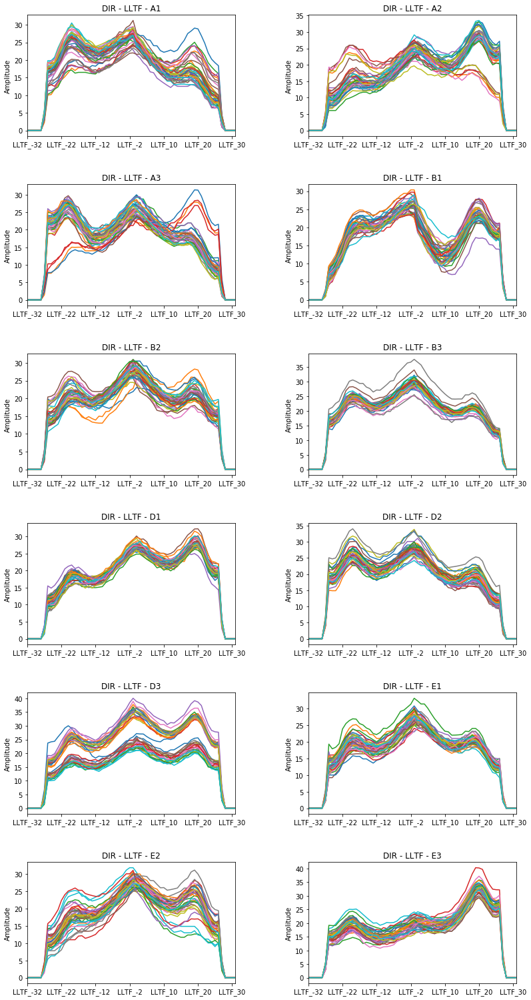

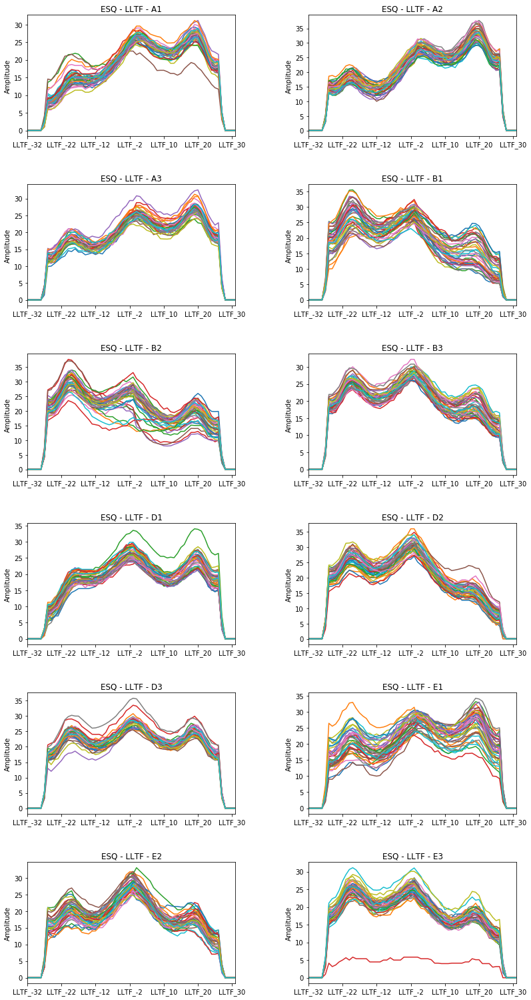

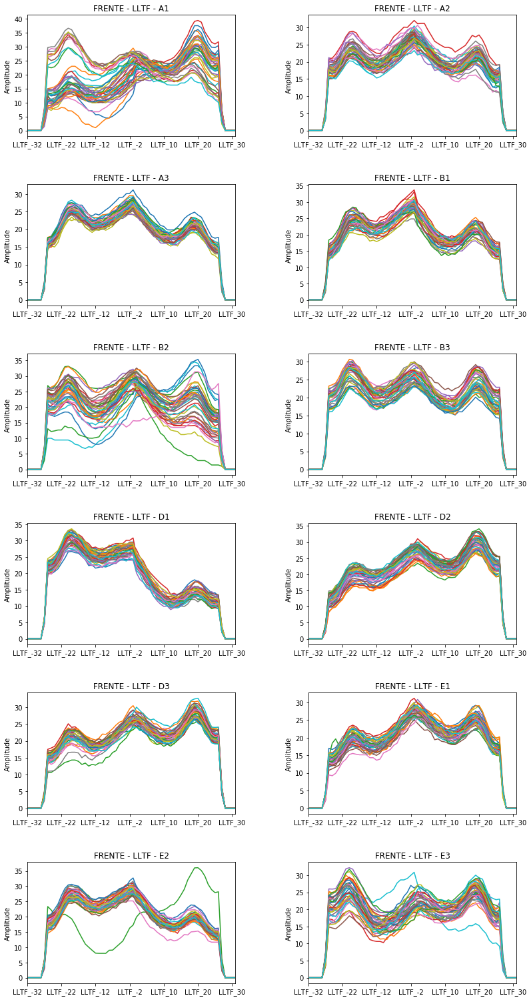

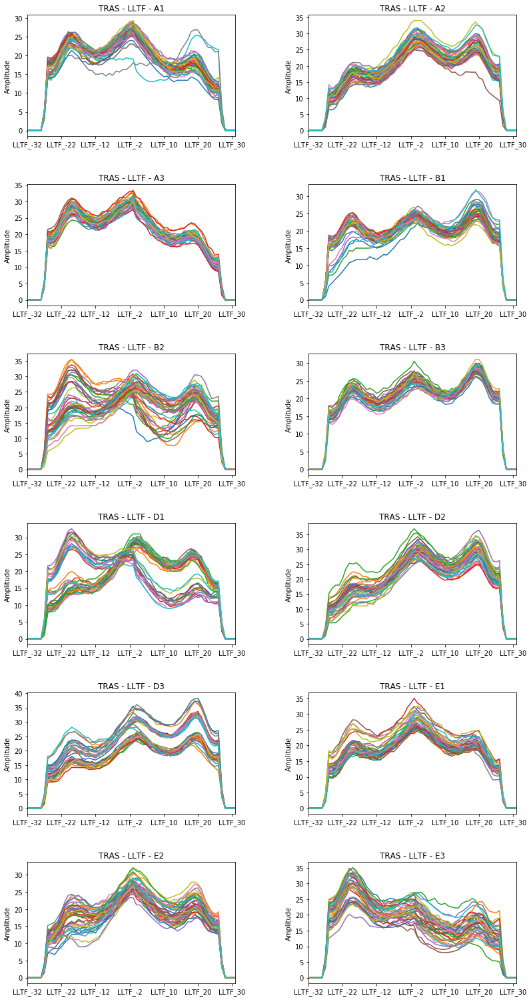

In [13]:
#12 gráficos por pontos a cada direção - LLTF 
for w in csidf["device"].unique():
    data = csidf[csidf["device"]==w]
    data_A1 = data[data["local"]=="A1"]
    data_A2 = data[data["local"]=="A2"]
    data_A3 = data[data["local"]=="A3"]
    data_B1 = data[data["local"]=="B1"]
    data_B2 = data[data["local"]=="B2"]
    data_B3 = data[data["local"]=="B3"]
    data_D1 = data[data["local"]=="D1"]
    data_D2 = data[data["local"]=="D2"]
    data_D3 = data[data["local"]=="D3"]
    data_E1 = data[data["local"]=="E1"]
    data_E2 = data[data["local"]=="E2"]
    data_E3 = data[data["local"]=="E3"]
    fig, axes = plt.subplots(nrows=6, ncols=2,figsize=(12,24))
    for x in data_A1.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" - LLTF - A1")
    for x in data_A2.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" - LLTF - A2")
    for x in data_A3.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" - LLTF - A3")
    for x in data_B1.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" - LLTF - B1")
    for x in data_B2.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[2,0])
    axes[2,0].set_ylabel("Amplitude")
    axes[2,0].set_title(w +" - LLTF - B2")
    for x in data_B3.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[2,1])
    axes[2,1].set_ylabel("Amplitude")
    axes[2,1].set_title(w +" - LLTF - B3")
    for x in data_D1.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[3,0])
    axes[3,0].set_ylabel("Amplitude")
    axes[3,0].set_title(w +" - LLTF - D1")
    for x in data_D2.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[3,1])
    axes[3,1].set_ylabel("Amplitude")
    axes[3,1].set_title(w +" - LLTF - D2")
    for x in data_D3.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[4,0])
    axes[4,0].set_ylabel("Amplitude")
    axes[4,0].set_title(w +" - LLTF - D3")
    for x in data_E1.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[4,1])
    axes[4,1].set_ylabel("Amplitude")
    axes[4,1].set_title(w +" - LLTF - E1")
    for x in data_E2.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[5,0])
    axes[5,0].set_ylabel("Amplitude")
    axes[5,0].set_title(w +" - LLTF - E2")
    for x in data_E3.index:
        data[data.columns[8:70:1]].loc[x].plot(ax=axes[5,1])
    axes[5,1].set_ylabel("Amplitude")
    axes[5,1].set_title(w +" - LLTF - E3")
    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.4,
                    wspace=0.35)
    fig_name = w + "_LLTF_12_POSICOES.png"
    plt.savefig(fig_name)

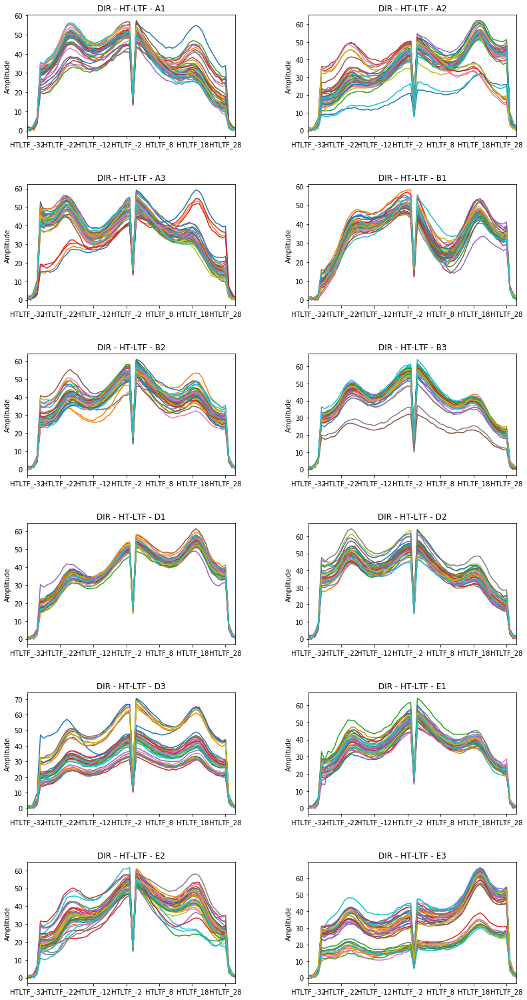

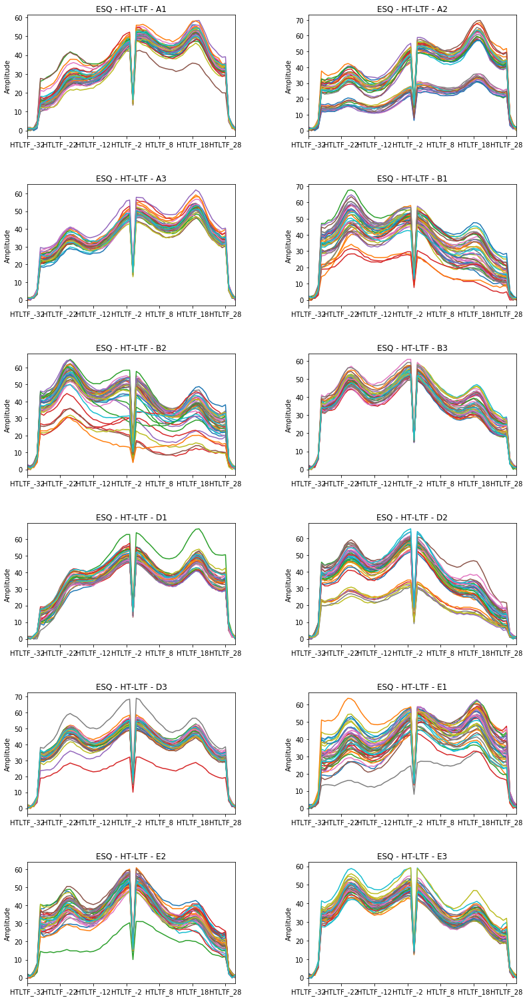

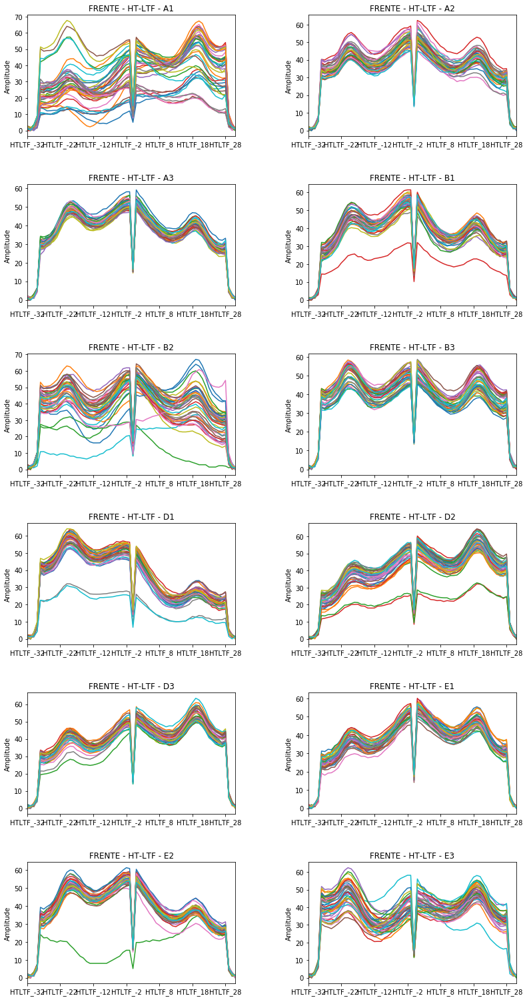

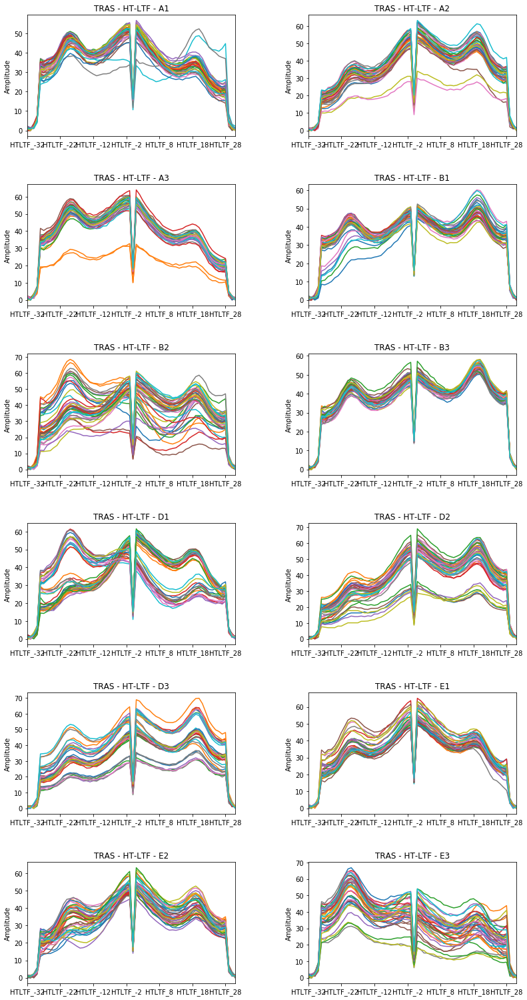

In [14]:
#12 gráficos por pontos a cada direção - HT-LTF 
for w in csidf["device"].unique():
    data = csidf[csidf["device"]==w]
    data_A1 = data[data["local"]=="A1"]
    data_A2 = data[data["local"]=="A2"]
    data_A3 = data[data["local"]=="A3"]
    data_B1 = data[data["local"]=="B1"]
    data_B2 = data[data["local"]=="B2"]
    data_B3 = data[data["local"]=="B3"]
    data_D1 = data[data["local"]=="D1"]
    data_D2 = data[data["local"]=="D2"]
    data_D3 = data[data["local"]=="D3"]
    data_E1 = data[data["local"]=="E1"]
    data_E2 = data[data["local"]=="E2"]
    data_E3 = data[data["local"]=="E3"]
    fig, axes = plt.subplots(nrows=6, ncols=2,figsize=(12,24))
    for x in data_A1.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" - HT-LTF - A1")
    for x in data_A2.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" - HT-LTF - A2")
    for x in data_A3.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" - HT-LTF - A3")
    for x in data_B1.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" - HT-LTF - B1")
    for x in data_B2.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[2,0])
    axes[2,0].set_ylabel("Amplitude")
    axes[2,0].set_title(w +" - HT-LTF - B2")
    for x in data_B3.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[2,1])
    axes[2,1].set_ylabel("Amplitude")
    axes[2,1].set_title(w +" - HT-LTF - B3")
    for x in data_D1.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[3,0])
    axes[3,0].set_ylabel("Amplitude")
    axes[3,0].set_title(w +" - HT-LTF - D1")
    for x in data_D2.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[3,1])
    axes[3,1].set_ylabel("Amplitude")
    axes[3,1].set_title(w +" - HT-LTF - D2")
    for x in data_D3.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[4,0])
    axes[4,0].set_ylabel("Amplitude")
    axes[4,0].set_title(w +" - HT-LTF - D3")
    for x in data_E1.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[4,1])
    axes[4,1].set_ylabel("Amplitude")
    axes[4,1].set_title(w +" - HT-LTF - E1")
    for x in data_E2.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[5,0])
    axes[5,0].set_ylabel("Amplitude")
    axes[5,0].set_title(w +" - HT-LTF - E2")
    for x in data_E3.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[5,1])
    axes[5,1].set_ylabel("Amplitude")
    axes[5,1].set_title(w +" - HT-LTF - E3")
    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.4,
                    wspace=0.35)
    fig_name = w + "_HT_LTF_12_POSICOES.png"
    plt.savefig(fig_name)

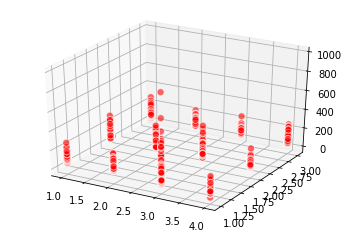

In [9]:
fig = plt.figure()
ax = plt.axes(projection="3d")
# Data for a three-dimensional line
zline = csidf["P_MW_LLTF"]
xline = csidf["x"]
yline = csidf["y"]
ax.scatter3D(xline, yline, zline, s=50, c="red",alpha=0.6, edgecolors='w')
# # Data for three-dimensional scattered points
# zdata = 15 * np.random.random(100)
# xdata = np.sin(zdata) + 0.1 * np.random.randn(100)
# ydata = np.cos(zdata) + 0.1 * np.random.randn(100)
# ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap="Greens");

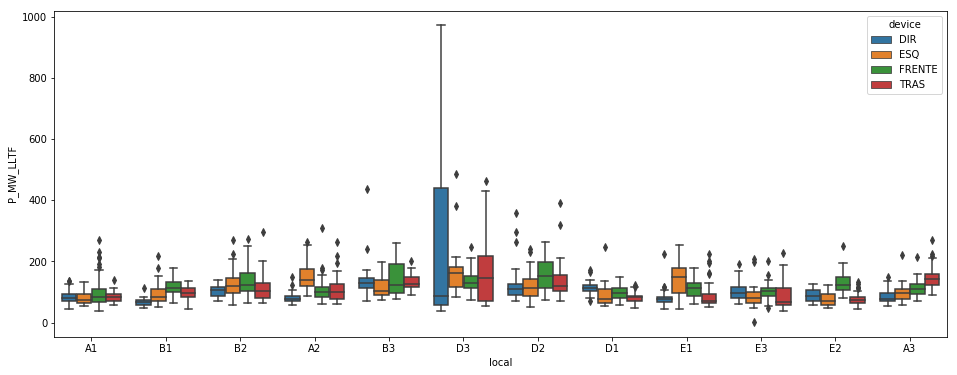

In [15]:
plt.rcParams['figure.figsize'] = (16,6)
sns.boxplot(x="local",y="P_MW_LLTF",data=csidf,hue="device")

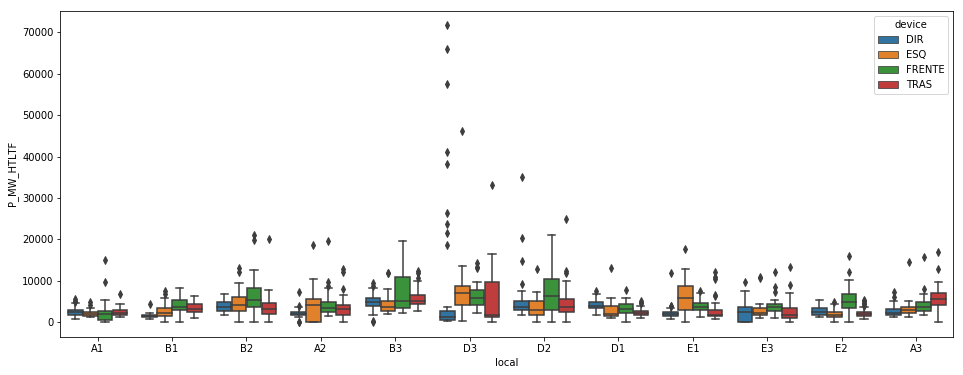

In [16]:
plt.rcParams['figure.figsize'] = (16,6)
sns.boxplot(x="local",y="P_MW_HTLTF",data=csidf,hue="device")

In [68]:
csidf.head()

,device,local,x,y,P_MW_LLTF,P_MW_HTLTF,P_DBM_LLTF,P_DBM_HTLTF,LLTF_-32,LLTF_-31,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,DIR,A1,1,3,68,1763,18.326305,32.462711,0,0,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,DIR,A1,1,3,91,2902,19.625982,34.627993,0,0,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,DIR,A1,1,3,79,1819,19.009755,32.599737,0,0,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,DIR,A1,1,3,82,2482,19.157725,33.949590,0,0,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,DIR,A1,1,3,43,736,16.433430,28.670187,0,0,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


In [64]:
##### COMEÇANDO O MACHINE LEARNING - KNN

In [66]:
from sklearn.preprocessing import StandardScaler #Importa o standardscaler do scikit-learn

In [67]:
scaler = StandardScaler() #Cria um objet StandardScaler()  chamado scaler

In [93]:
csidf.drop(csidf.columns[:8],axis=1).head()

,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,LLTF_-26,LLTF_-25,LLTF_-24,LLTF_-23,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,0,0,0,0,0,4.123106,15.297059,16.124515,17.029386,18.027756,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,0,0,0,0,0,5.000000,17.029386,17.117243,18.439089,19.646883,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,0,0,0,0,0,4.000000,17.029386,17.117243,17.464249,19.924859,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,0,0,0,0,0,4.123106,17.464249,17.492856,18.601075,20.615528,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,0,0,0,0,0,3.162278,14.866069,15.524175,16.278821,18.248288,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


In [94]:
scaler.fit(csidf.drop(csidf.columns[:8],axis=1)) #Usa o método fit para treinar o modelo

C:\Users\iande\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



StandardScaler(copy=True, with_mean=True, with_std=True)

In [95]:
#** Use o método .transform () para transformar os parâmetros em uma versão padronizada. **
scaled_features = scaler.transform(csidf.drop(csidf.columns[:8],axis=1))

C:\Users\iande\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



In [96]:
#** Converta os parâmetros padronizados em um DataFrame e verifique o cabeçalho desse DataFrame para garantir que a transform() funcionou. **
df_feat = pd.DataFrame(scaled_features,columns=csidf.columns[8:])
df_feat.head()

,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,LLTF_-26,LLTF_-25,LLTF_-24,LLTF_-23,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,0.0,0.0,0.0,0.0,0.0,0.182844,-0.015516,0.149067,0.201551,0.125525,...,-1.535694,-1.607707,-1.629812,-1.692946,-1.651328,-1.755265,-1.656862,-1.749149,-2.371981,0.906988
1,0.0,0.0,0.0,0.0,0.0,0.877877,0.365508,0.371093,0.517897,0.477087,...,-1.331682,-1.260266,-1.363416,-1.398726,-1.319093,-1.434603,-1.503478,-0.992786,0.253550,-1.849046
2,0.0,0.0,0.0,0.0,0.0,0.085269,0.365508,0.371093,0.299137,0.537445,...,-1.644939,-1.704147,-1.581282,-1.615773,-1.679059,-1.681502,-1.744078,-1.749149,-1.197808,0.906988
3,0.0,0.0,0.0,0.0,0.0,0.182844,0.461156,0.455100,0.554248,0.687410,...,-1.549643,-1.562538,-1.629812,-1.644775,-1.601015,-1.773170,-1.827942,-1.879529,-2.371981,0.099764
4,0.0,0.0,0.0,0.0,0.0,-0.578716,-0.110312,0.014800,0.033119,0.173409,...,-1.749767,-1.771162,-1.830447,-1.867078,-1.812326,-1.728813,-1.791999,-1.749149,-1.197808,0.906988


In [97]:
#Divisão dos dados em conjunto de treino e teste
from sklearn.model_selection import train_test_split #Importa a função de split

In [98]:
X_train, X_test, y_train, y_test = train_test_split(scaled_features,csidf["local"],
                                                    test_size=0.30)

In [99]:
#Importa o KNeighborClassifier do scikit learn
from sklearn.neighbors import KNeighborsClassifier

In [100]:
knn = KNeighborsClassifier(n_neighbors=1) #** Crie uma instância do modelo KNN com n_neighbors = 1 **

In [101]:
knn.fit(X_train,y_train) #** Ajuste este modelo KNN aos dados de treinamento. **

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=1, p=2,
           weights='uniform')

In [102]:
# Previsões e avaliações
#Vamos avaliar o nosso modelo KNN!
pred = knn.predict(X_test) #** Use o método de previsão para prever valores usando seu modelo KNN e X_test. **

In [103]:
from sklearn.metrics import classification_report,confusion_matrix #** Crie uma matriz de confusão e um relatório de classificação. **

In [104]:
print(confusion_matrix(y_test,pred))

[[24  1  3  1  4  3  0  1  3  1  1  4]
 [ 5 26  0  1  1  2  2  4  2  7  0  1]
 [ 0  0 29  1  0  1  2  0  5  0  1  1]
 [ 5  0  1 24  0  1  2  1  5  2  1  1]
 [ 2  3  1  0 19  5  3  6  0  2  1  6]
 [ 1  1  0  1  1 32  0  3  8  2  0  0]
 [ 0  1  0  1  1  0 41  1  1  1  2  1]
 [ 1 10  3  1  1  7  1 30  2  3  0  0]
 [ 0  2  0  1  0  5  0  1 39  1  0  0]
 [ 4  2  2  0  2  1  1  0  2 34  0  0]
 [ 4  2  1  3  6  0  2  1  2  2 23  1]
 [ 1  0  1  0  4  5  0  0  0  0  2 33]]


In [105]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

          A1       0.51      0.52      0.52        46
          A2       0.54      0.51      0.53        51
          A3       0.71      0.72      0.72        40
          B1       0.71      0.56      0.62        43
          B2       0.49      0.40      0.44        48
          B3       0.52      0.65      0.58        49
          D1       0.76      0.82      0.79        50
          D2       0.62      0.51      0.56        59
          D3       0.57      0.80      0.66        49
          E1       0.62      0.71      0.66        48
          E2       0.74      0.49      0.59        47
          E3       0.69      0.72      0.70        46

   micro avg       0.61      0.61      0.61       576
   macro avg       0.62      0.62      0.61       576
weighted avg       0.62      0.61      0.61       576



In [106]:
#Método do cotovelo para escolher um bom valor de K!!
error_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

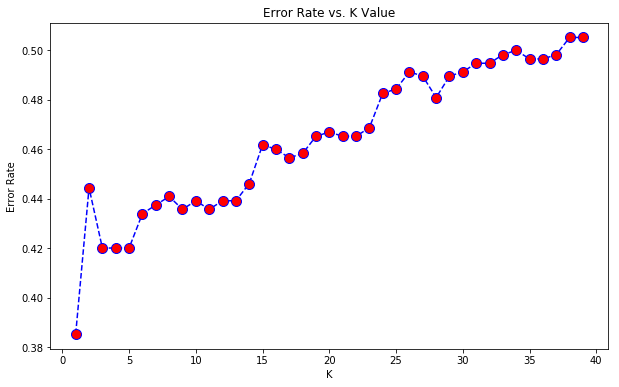

In [107]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [6]:
from sklearn.preprocessing import Normalizer

In [8]:
teste_df = csidf[csidf.columns[8:70]]
transformer = Normalizer(norm="l1").fit(teste_df)  # fit does nothing.
transformer
teste_df = transformer.transform(teste_df)
data_lltf = pd.DataFrame(teste_df)
teste_df = csidf[csidf.columns[70:134]]
transformer = Normalizer(norm="l1").fit(teste_df)  # fit does nothing.
transformer
teste_df = transformer.transform(teste_df)
data_ht_ltf = pd.DataFrame(teste_df)
csidf[csidf.columns[70:134]] = data_ht_ltf
csidf[csidf.columns[8:70]] = data_lltf

In [9]:
csidf.head()

,device,local,x,y,P_MW_LLTF,P_MW_HTLTF,P_DBM_LLTF,P_DBM_HTLTF,LLTF_-32,LLTF_-31,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,DIR,A1,1,3,68,1763,18.326305,32.462711,0.0,0.0,...,0.010802,0.009290,0.008327,0.007399,0.007119,0.006262,0.006651,0.001093,0.000000,0.000691
1,DIR,A1,1,3,91,2902,19.625982,34.627993,0.0,0.0,...,0.011217,0.010342,0.009044,0.008254,0.008135,0.007276,0.006987,0.001679,0.001042,0.000000
2,DIR,A1,1,3,79,1819,19.009755,32.599737,0.0,0.0,...,0.010077,0.008680,0.008371,0.007578,0.006863,0.006448,0.006138,0.001072,0.000479,0.000678
3,DIR,A1,1,3,82,2482,19.157725,33.949590,0.0,0.0,...,0.010430,0.009225,0.008090,0.007391,0.007126,0.006009,0.005721,0.000950,0.000000,0.000475
4,DIR,A1,1,3,43,736,16.433430,28.670187,0.0,0.0,...,0.010900,0.009533,0.008301,0.007413,0.007168,0.007106,0.006741,0.001219,0.000545,0.000771


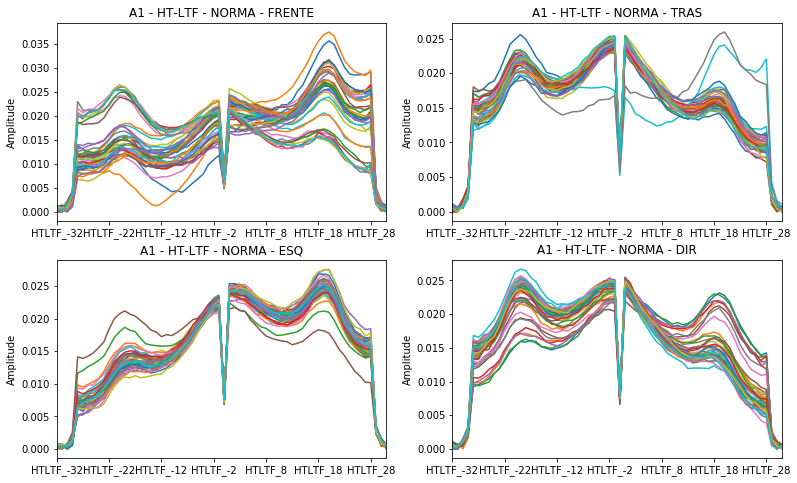

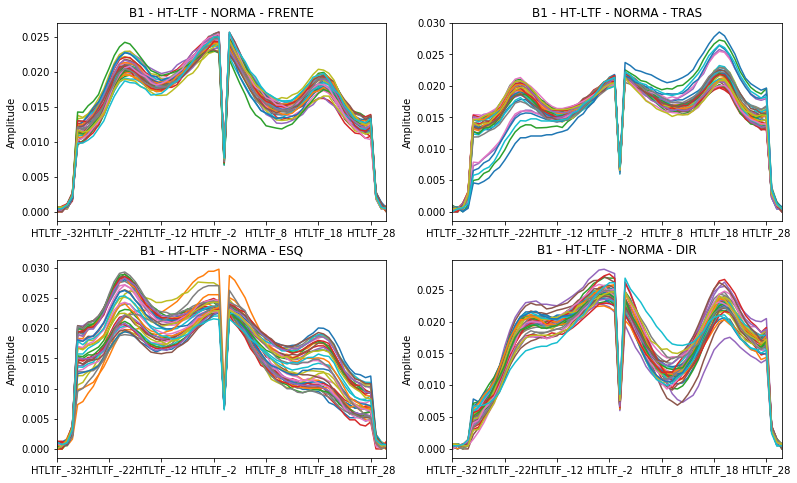

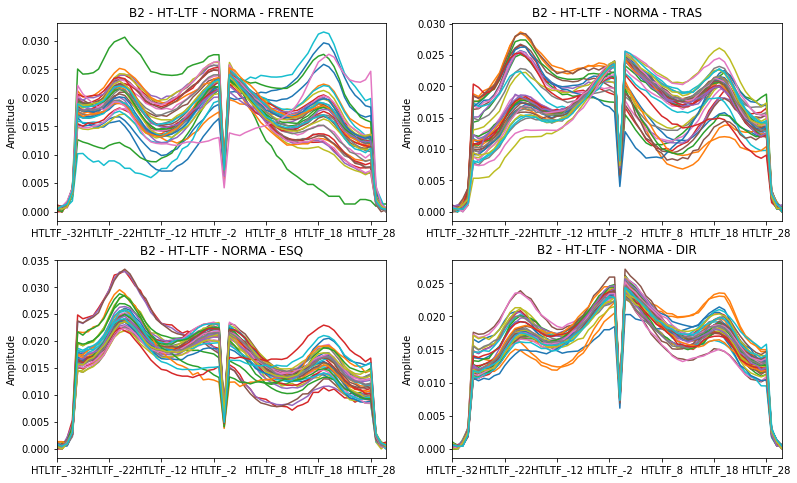

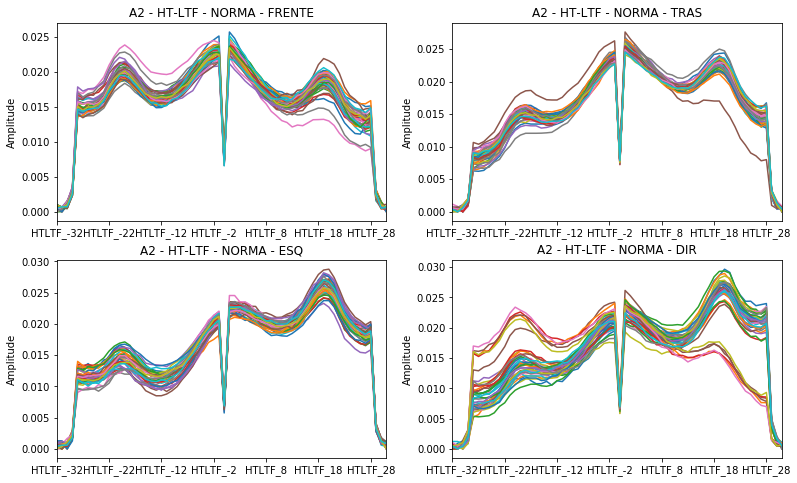

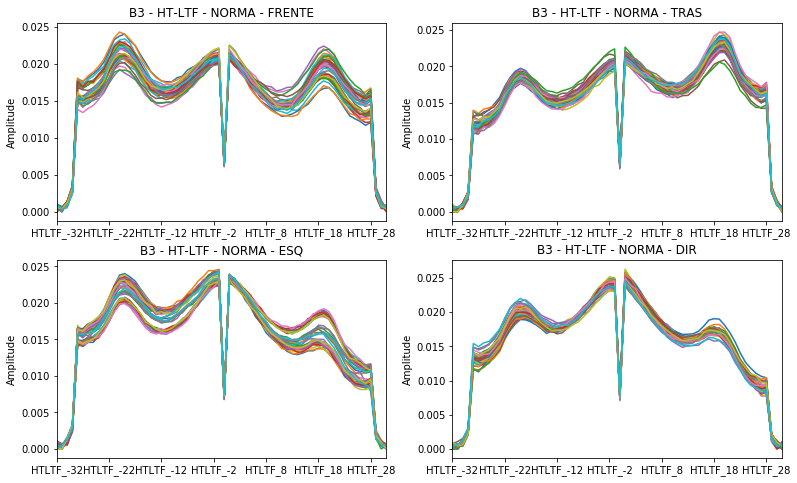

...

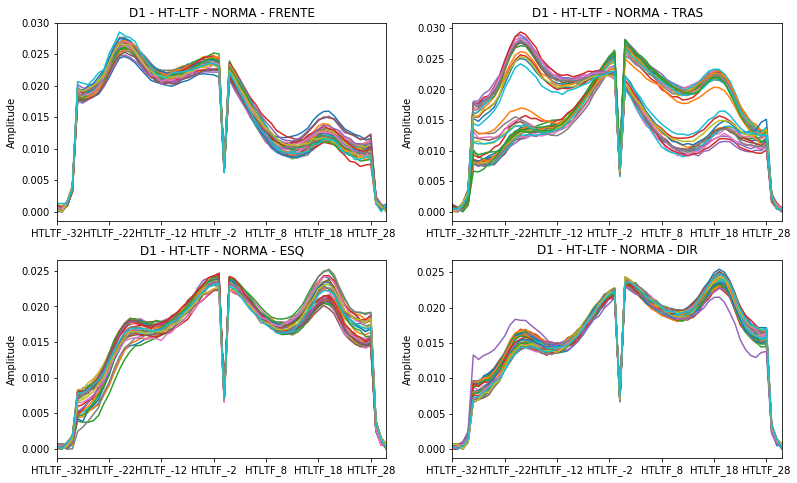

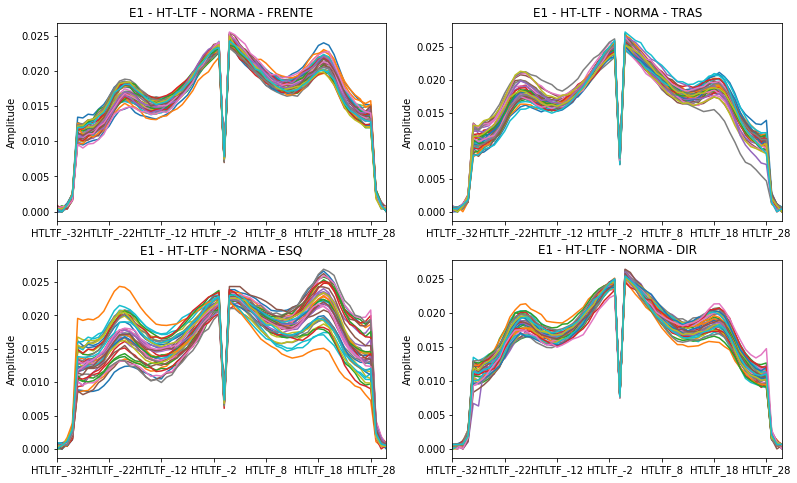

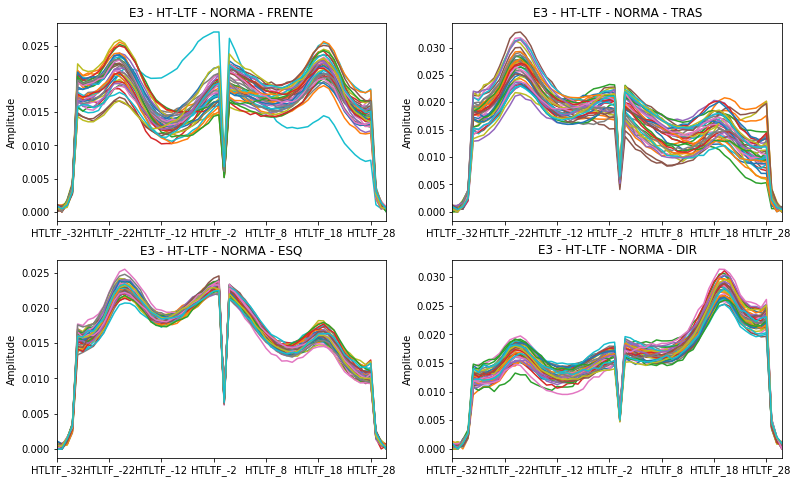

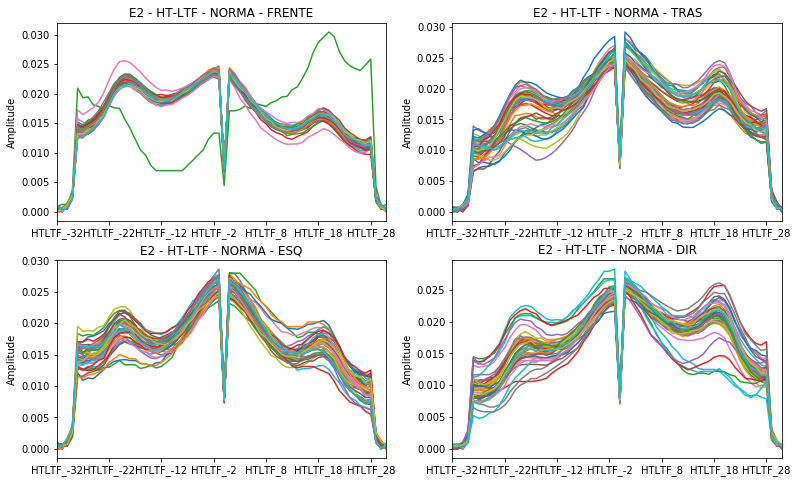

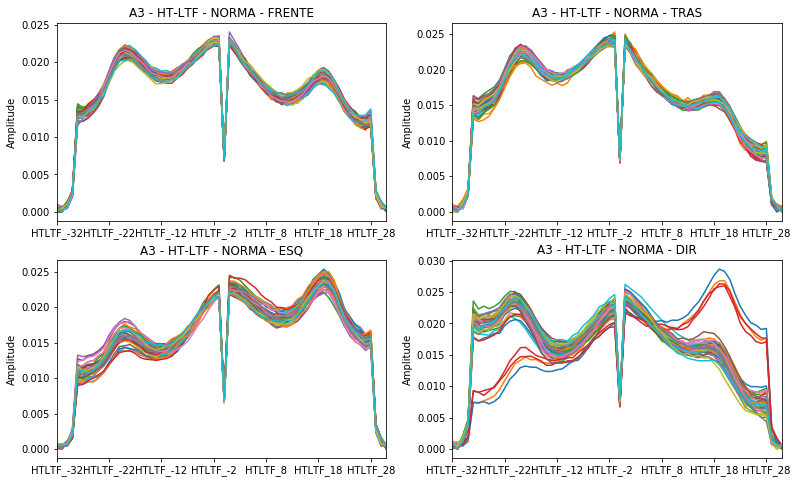

In [10]:
#4 GRÁFICOS POR LOCAL - 1 EM CADA DIREÇÃO - HT-LTF - USANDO DADOS NORMALIZADOS
for w in csidf["local"].unique():
    data = csidf[csidf["local"]==w]
    data_frente = data[data["device"]=="FRENTE"]
    data_tras = data[data["device"]=="TRAS"]
    data_esq = data[data["device"]=="ESQ"]
    data_dir = data[data["device"]=="DIR"]
    fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(13,8))
    for x in data_frente.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" - HT-LTF - NORMA - FRENTE")
    for x in data_tras.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" - HT-LTF - NORMA - TRAS")
    for x in data_esq.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" - HT-LTF - NORMA - ESQ")
    for x in data_dir.index:
        data[data.columns[70:len(data.columns):1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" - HT-LTF - NORMA - DIR")
    fig_name = w + "_norma_db_HT_LTF_4_Direcoes.png"
    plt.savefig(fig_name)